In [1]:
import sys
import time
import file_helper
import os
import json
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import cnn_feature_service
import object_detection
import matplotlib.gridspec as gridspec

%matplotlib inline



In [2]:
model_type='ResNet_152'
onedrive_user='SzMike'
top_count=5
#base_folder = r'd:\Projects\WISH'
base_folder = os.path.curdir

test_image_dir=r'c:\Users\\'+onedrive_user+'\OneDrive\WISH\TestImages_Praktiker'
#image_dir=r'e:\WISH\data\classification'
db_category_file=r'c:\Users\\'+onedrive_user+'\OneDrive\WISH\ProductImages\image_category.json'


In [3]:
with open(db_category_file, 'r', encoding='utf-16') as fp:
    temp_categories = json.load(fp)

db_categories={}
for items in temp_categories.keys():
    db_categories[os.path.basename(items)]=temp_categories[items]

# query images
image_list_indir=file_helper.imagelist_in_depth(test_image_dir,level=1)
#for i,q_im in enumerate(image_list_indir):
#    print(str(i)+' : '+q_im)

In [4]:
cnn_f=cnn_feature_service.cnn_db_features(model_type=model_type,db_feature_file=r'c:\Users\\'+onedrive_user+'\OneDrive\WISH\Features\db_features_ResNet152_1000_praktiker.json')

...loading model
...cnn model is loaded


In [8]:
query_category={}
match_cat={}
match_im={}

top_count=5

match=0
for q_im in image_list_indir:
    cont_dir=q_im.split('\\')[-2]
    query_category[q_im]=cont_dir
    query_im=Image.open(q_im)
    query_im.thumbnail((300,300))
    query_feat=np.array(cnn_f.create_feature(query_im)) 
    cf=cnn_f.compare_feature(query_feat.reshape(1,-1),cnn_f.db_features,metric='cosine')
    print('---------------------')
    print(cf.min())    
    result_indices = np.argsort(cf,axis=0)[0:top_count]
    print(cont_dir)
    m_cat=[]
    m_im=[]
    for i in range(len(result_indices)):
        image_file=cnn_f.db_files_list[result_indices[i,0]]
        try:
            cat=db_categories[os.path.basename(image_file)]
            print(cat)
        except:
            cat='None'
            print('No category is assigned') 
            
        m_cat.append(cat)
        m_im.append(image_file)
        if query_category[q_im]==cat:
            match+=1
            break
    match_cat[q_im]=m_cat
    match_im[q_im]=m_im            


---------------------
0.178036824163
Alsószekrény, alsószekrény mosdóval
Mosdó, mosdóláb
Fürdőszoba, konyha
Fürdőszoba, konyha
Mosdó, mosdóláb
Különálló fürdőszobaszekrény
---------------------
0.232240616458
Autó ápolás
Oldószeres festék
Oldószeres festék
Oldószeres festék
Oldószeres festék
Oldószeres festék
---------------------
0.417602461198
Autófelszerelés, segély
Autófelszerelés, segély
---------------------
0.167995797294
Autófelszerelés, segély
Autófelszerelés, segély
---------------------
0.219960393305
Begyűjtó, faszén
Térkő, gyeprács, sziklakert
Gipsz, mész, vakolat, homok
Aljzatkiegyenlítő, tapadóhíd
Tüzelőanyag
Hidrokultúrás növény anyagok
---------------------
0.262794947424
Beltéri lámpa
Nappali, étkező
Nyílászáró
Kültéri dekor falburkoló
Tapéta, bordűr, poszter
Locsolóeszköz, szerelvény
---------------------
0.151291929904
Beltéri lámpa
Beltéri lámpa
---------------------
0.19019032974
Beltéri lámpa
Beltéri lámpa
---------------------
0.214980585917
Beltéri lámpa
Beltér

In [7]:
n_im = len(image_list_indir)

print(match/n_im)

0.64


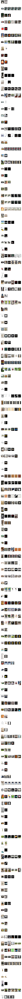

In [16]:
fig = plt.figure(figsize=(3*top_count,5*n_im))
for i_im,q_im in enumerate(image_list_indir):
    query_im=Image.open(q_im)
    query_im.thumbnail((300,300))
   
    ax1=plt.subplot(n_im,top_count+1,(top_count+1)*i_im+1)
    ax1.imshow(query_im)
    ax1.set_title(query_category[q_im],fontsize=10)
    ax1.axis('off')
    i=0
    for s_im in match_im[q_im]:
        i+=1
        sim_im=Image.open(s_im.replace('picturio',onedrive_user))
        sim_im.thumbnail((300,300))
        ax=plt.subplot(n_im,top_count+1,(top_count+1)*i_im+i+1)
        ax.imshow(sim_im)
        ax.set_title(db_categories[os.path.basename(s_im)],fontsize=10)
        ax.axis('off')